# Object Detection on Satellite Imagery using YOLOv8

In [1]:
# !pip install -U -q gdown ultralytics

In [2]:
import os
import shutil
import gdown
import random
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from collections import Counter
from xml.etree import ElementTree
import cv2
import matplotlib.pyplot as plt
from IPython.display import Image, Video
from ultralytics import YOLO

## Downloading Dataset

In [3]:
raw_data_path = r'../data/DIOR/'

In [4]:
if os.path.exists(raw_data_path):
    print('[INFO] Raw data directory exists, skiping download.')
else:
    os.makedirs(raw_data_path)
    print('[INFO] Raw data directory is been created.')
    print('[INFO] Downloading data...\n')
    gdown.download('https://drive.google.com/uc?id=1KoQzqR20qvIXDf1qsXCHGxD003IPmXMw', output=os.path.join(raw_data_path, 'Annotations.zip'))
    gdown.download('https://drive.google.com/uc?id=11SXPqcESez9qTn4Z5Q3v35K9hRwO_epr', output=os.path.join(raw_data_path, 'JPEGImages-test.zip'))
    gdown.download('https://drive.google.com/uc?id=1ZHbHDM6hYAEGDC_K5eiW0yF_lzVgpuir', output=os.path.join(raw_data_path, 'JPEGImages-trainval.zip'))
    print('[INFO] Data is been downloaded.')

[INFO] Raw data directory exists, skiping download.


In [5]:
dior_data_path = r'../data/DIOR/'

In [6]:
# Extracting the zip data files
if os.path.exists(dior_data_path):
    print('[INFO] DIOR data directory exists, skiping extraction.')
else:
    os.makedirs(dior_data_path)
    for i in os.listdir(raw_data_path):
        filename = os.path.join(raw_data_path, i) 
        shutil.unpack_archive(filename=filename, extract_dir=dior_data_path)
        print(f'[INFO] File "{filename}" is been extracted to "{dior_data_path}".')

[INFO] DIOR data directory exists, skiping extraction.


## Data Preprocessing, EDA and Visualization

In [7]:
# Path for all the data
annot_data_path = r'../data/DIOR/Annotations/Horizontal Bounding Boxes/'
trainval_data_path = r'../data/DIOR/JPEGImages-trainval/'
test_data_path = r'../data/DIOR/JPEGImages-test/'

In [8]:
# Creating a list of annotation files
annot_file_list = sorted([os.path.join(annot_data_path, i) for i in os.listdir(annot_data_path) if '.xml' in i])
annot_file_list[:5], annot_file_list[-5:], len(annot_file_list)

(['../data/DIOR/Annotations/Horizontal Bounding Boxes/00001.xml',
  '../data/DIOR/Annotations/Horizontal Bounding Boxes/00002.xml',
  '../data/DIOR/Annotations/Horizontal Bounding Boxes/00003.xml',
  '../data/DIOR/Annotations/Horizontal Bounding Boxes/00004.xml',
  '../data/DIOR/Annotations/Horizontal Bounding Boxes/00005.xml'],
 ['../data/DIOR/Annotations/Horizontal Bounding Boxes/23459.xml',
  '../data/DIOR/Annotations/Horizontal Bounding Boxes/23460.xml',
  '../data/DIOR/Annotations/Horizontal Bounding Boxes/23461.xml',
  '../data/DIOR/Annotations/Horizontal Bounding Boxes/23462.xml',
  '../data/DIOR/Annotations/Horizontal Bounding Boxes/23463.xml'],
 23463)

In [9]:
# Creating a list of training and validation images
trainval_file_list = sorted([os.path.join(trainval_data_path, i) for i in os.listdir(trainval_data_path) if '.jpg' in i])
trainval_file_list[:5], trainval_file_list[-5:], len(trainval_file_list)

(['../data/DIOR/JPEGImages-trainval/00001.jpg',
  '../data/DIOR/JPEGImages-trainval/00002.jpg',
  '../data/DIOR/JPEGImages-trainval/00003.jpg',
  '../data/DIOR/JPEGImages-trainval/00004.jpg',
  '../data/DIOR/JPEGImages-trainval/00005.jpg'],
 ['../data/DIOR/JPEGImages-trainval/11721.jpg',
  '../data/DIOR/JPEGImages-trainval/11722.jpg',
  '../data/DIOR/JPEGImages-trainval/11723.jpg',
  '../data/DIOR/JPEGImages-trainval/11724.jpg',
  '../data/DIOR/JPEGImages-trainval/11725.jpg'],
 11725)

In [10]:
# Creating a list of testing images
test_file_list = sorted([os.path.join(test_data_path, i) for i in os.listdir(test_data_path) if '.jpg' in i])
test_file_list[:5], test_file_list[-5:], len(test_file_list)

(['../data/DIOR/JPEGImages-test/11726.jpg',
  '../data/DIOR/JPEGImages-test/11727.jpg',
  '../data/DIOR/JPEGImages-test/11728.jpg',
  '../data/DIOR/JPEGImages-test/11729.jpg',
  '../data/DIOR/JPEGImages-test/11730.jpg'],
 ['../data/DIOR/JPEGImages-test/23459.jpg',
  '../data/DIOR/JPEGImages-test/23460.jpg',
  '../data/DIOR/JPEGImages-test/23461.jpg',
  '../data/DIOR/JPEGImages-test/23462.jpg',
  '../data/DIOR/JPEGImages-test/23463.jpg'],
 11738)

In [11]:
# Combining all the images path in one list
image_data_file_list = np.concatenate((trainval_file_list, test_file_list))
image_data_file_list[:5], image_data_file_list[-5:], len(image_data_file_list)

(array(['../data/DIOR/JPEGImages-trainval/00001.jpg', '../data/DIOR/JPEGImages-trainval/00002.jpg', '../data/DIOR/JPEGImages-trainval/00003.jpg', '../data/DIOR/JPEGImages-trainval/00004.jpg', '../data/DIOR/JPEGImages-trainval/00005.jpg'], dtype='<U42'),
 array(['../data/DIOR/JPEGImages-test/23459.jpg', '../data/DIOR/JPEGImages-test/23460.jpg', '../data/DIOR/JPEGImages-test/23461.jpg', '../data/DIOR/JPEGImages-test/23462.jpg', '../data/DIOR/JPEGImages-test/23463.jpg'], dtype='<U42'),
 23463)

### Exploratory Data Analysis

In [12]:
import pickle
# Extracting data from annotation files
meta_list = [] # To store general info for every image
object_list_train = [] # To store object classes info of train dataset
object_list_test = [] # To store object classes info of test dataset

if os.path.exists('../data/DIOR/meta_list.pkl') and os.path.exists('../data/DIOR/object_instance_list_train.pkl') and os.path.exists('../data/DIOR/object_instance_list_test.pkl') and os.path.exists('../data/DIOR/class_dict.pkl'):
    print('[INFO] Meta data files exists, skiping extraction.')
    with open('../data/DIOR/meta_list.pkl', 'rb') as f:
        meta_list = pickle.load(f)
    with open('../data/DIOR/object_instance_list_train.pkl', 'rb') as f:
        object_instance_list_train = pickle.load(f)
    with open('../data/DIOR/object_instance_list_test.pkl', 'rb') as f:
        object_instance_list_test = pickle.load(f)
    with open('../data/DIOR/class_dict.pkl', 'rb') as f:
        class_dict = pickle.load(f)
else:
    print('[INFO] Extracting meta data from annotation files...')

    for file in tqdm(annot_file_list):
        meta_dict = {}
        root = ElementTree.parse(file).getroot()
        
        # Filename - extracted
        for path in image_data_file_list:
            if root.find('filename').text in path:
                meta_dict['filename'] = path
                meta_dict['split_type'] = path.split('/')[-2]
        
        # Width - extracted
        meta_dict['width'] = int(root.find('size').find('width').text)
        
        # Height - extracted
        meta_dict['height'] = int(root.find('size').find('height').text)
        
        # Objects - extracted and combined into a single string
        meta_dict['objects'] = ', '.join(np.unique([obj.find('name').text for obj in root.findall('object')]))
        meta_list.append(meta_dict)
        
        # Collecting all the object classes instance and counting total appearance
        for obj in root.findall('object'):
            if meta_dict['split_type'] == 'JPEGImages-trainval':
                object_list_train.append(obj.find('name').text)
            elif meta_dict['split_type'] == 'JPEGImages-test':
                object_list_test.append(obj.find('name').text)
        
    # Counting the instance for every object class
    object_instance_list_train = Counter(sorted(object_list_train))
    object_instance_list_test = Counter(sorted(object_list_test))
        
    # Collecting Class list and indexing it also in a sequence
    class_dict = {k: v for v, k in enumerate(sorted(np.unique(object_list_train)))}

    # Saving the meta_list, object_instance_list_train, object_instance_list_test, class_dict
    with open('../data/DIOR/meta_list.pkl', 'wb') as f:
        pickle.dump(meta_list, f)

    with open('../data/DIOR/object_instance_list_train.pkl', 'wb') as f:
        pickle.dump(object_instance_list_train, f)

    with open('../data/DIOR/object_instance_list_test.pkl', 'wb') as f:
        pickle.dump(object_instance_list_test, f)

    with open('../data/DIOR/class_dict.pkl', 'wb') as f:
        pickle.dump(class_dict, f)

meta_list[:5], object_instance_list_train, object_instance_list_test, class_dict

[INFO] Meta data files exists, skiping extraction.


([{'filename': '../data/DIOR/JPEGImages-trainval/00001.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'golffield'},
  {'filename': '../data/DIOR/JPEGImages-trainval/00002.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'Expressway-toll-station, vehicle'},
  {'filename': '../data/DIOR/JPEGImages-trainval/00003.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'trainstation'},
  {'filename': '../data/DIOR/JPEGImages-trainval/00004.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'chimney'},
  {'filename': '../data/DIOR/JPEGImages-trainval/00005.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'storagetank, vehicle'}],
 Counter({'Expressway-Service-area': 1080,
          'Expressway-toll-station': 610,
          'airplane': 1888,
          'airport': 662,
     

In [13]:
# Creating a dataframe from the extracted data
meta_df = pd.DataFrame(meta_list)
meta_df

,filename,split_type,width,height,objects
0,../data/DIOR/JPEGImages-trainval/00001.jpg,JPEGImages-trainval,800,800,golffield
1,../data/DIOR/JPEGImages-trainval/00002.jpg,JPEGImages-trainval,800,800,"Expressway-toll-station, vehicle"
2,../data/DIOR/JPEGImages-trainval/00003.jpg,JPEGImages-trainval,800,800,trainstation
3,../data/DIOR/JPEGImages-trainval/00004.jpg,JPEGImages-trainval,800,800,chimney
4,../data/DIOR/JPEGImages-trainval/00005.jpg,JPEGImages-trainval,800,800,"storagetank, vehicle"
...,...,...,...,...,...
23458,../data/DIOR/JPEGImages-test/23459.jpg,JPEGImages-test,800,800,vehicle
23459,../data/DIOR/JPEGImages-test/23460.jpg,JPEGImages-test,800,800,"groundtrackfield, tenniscourt, vehicle"
23460,../data/DIOR/JPEGImages-test/23461.jpg,JPEGImages-test,800,800,"overpass, vehicle"
23461,../data/DIOR/JPEGImages-test/23462.jpg,JPEGImages-test,800,800,"overpass, vehicle"


In [14]:
print(f'Size of the images width: {meta_df.width.unique()[0]} and height: {meta_df.height.unique()[0]}')
print(f'Total number of classes with all possible combination: {len(meta_df.objects.unique())}')
print(f'Total length of the training/validation dataset: {len(meta_df[meta_df["split_type"] == "JPEGImages-trainval"])} and testing dataset: {len(meta_df[meta_df["split_type"] == "JPEGImages-test"])}')

Size of the images width: 800 and height: 800
Total number of classes with all possible combination: 526
Total length of the training/validation dataset: 11725 and testing dataset: 11738


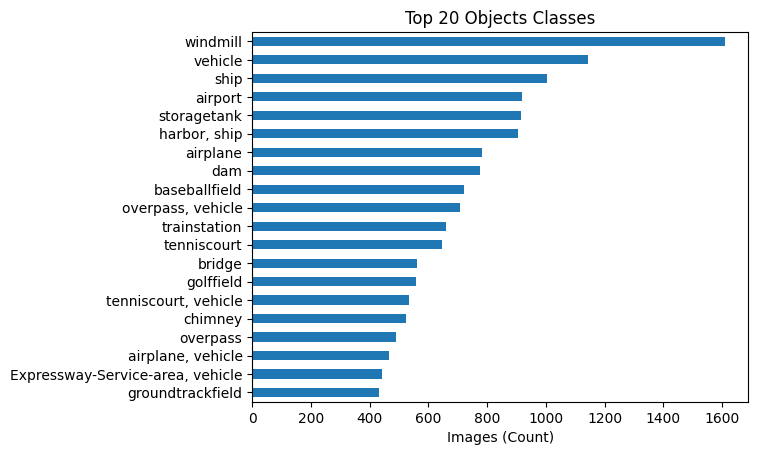

In [15]:
# Top 20 classes in the dataset
meta_df.objects.value_counts()[:20].plot(kind='barh').invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Top 20 Objects Classes');

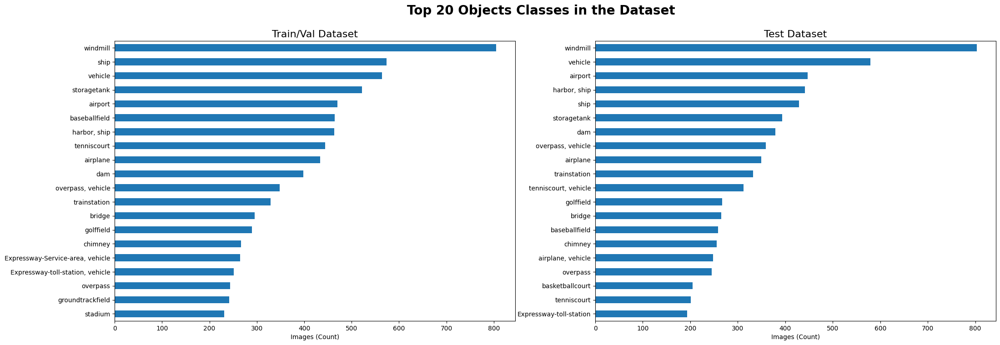

In [16]:
plt.figure(figsize=(25, 8))
plt.subplot(1, 2, 1)
meta_df[meta_df["split_type"] == "JPEGImages-trainval"].objects.value_counts()[:20].plot(kind='barh').invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Train/Val Dataset', fontsize=16)
plt.subplot(1, 2, 2)
meta_df[meta_df["split_type"] == "JPEGImages-test"].objects.value_counts()[:20].plot(kind='barh').invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Test Dataset', fontsize=16)
plt.suptitle('Top 20 Objects Classes in the Dataset', fontsize=20, fontweight='bold');

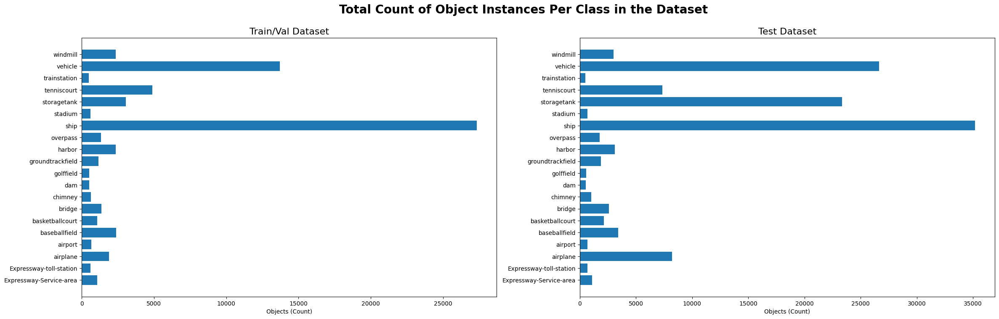

In [17]:
plt.figure(figsize=(28, 8))
plt.subplot(1, 2, 1)
plt.barh(list(object_instance_list_train.keys()), list(object_instance_list_train.values()))
plt.xlabel('Objects (Count)')
plt.title('Train/Val Dataset', fontsize=16)
plt.subplot(1, 2, 2)
plt.barh(list(object_instance_list_test.keys()), list(object_instance_list_test.values()))
plt.xlabel('Objects (Count)')
plt.title('Test Dataset', fontsize=16)
plt.suptitle('Total Count of Object Instances Per Class in the Dataset', fontsize=20, fontweight='bold');

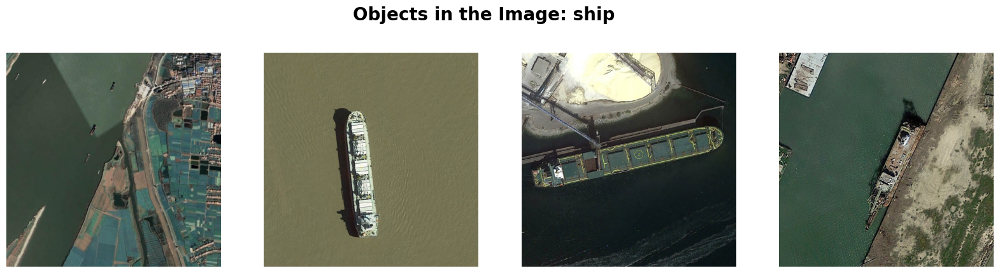

In [18]:
# Visualizing the classes - rerun the code for different classes.
viz_class = random.sample(meta_df.objects.tolist(), 1)[0]
viz_list = meta_df[meta_df['objects'] == viz_class].filename.tolist()
plt.figure(figsize=(20, 5))
rand = random.sample(viz_list, 4)
for i in range(4):
    plt.subplot(1, 4, i+1)
    plt.imshow(plt.imread(rand[i]))
    plt.suptitle(f'Objects in the Image: {viz_class}', fontsize=20, fontweight='bold')
    plt.axis(False)

### Converting Annotation to YOLO Format

In [19]:
# Creating a function for extracting data
def extract_data_from_xml(xml_file: str):
    """
    A function to extract data like filename, size, classes and bboxes from xml file.
    
    Parameters: xml_file: str, A string containing the path to the file.
    
    Returns: data_dict: dict, A dict containing all the extracted data.
    """
    root = ElementTree.parse(xml_file).getroot()
    
    # Creating dict and list to store data
    data_dict = {}
    data_dict['bboxes'] = []
    
    # Reading the xml file
    for element in root:
        # Getting the filename
        if element.tag == 'filename':
            data_dict['filename'] = element.text
        
        # Getting the image size
        elif element.tag == 'size':
            image_size = []
            for size_element in element:
                image_size.append(int(size_element.text))
            data_dict['image_size'] = image_size
        
        # Getting the bounding box
        elif element.tag == 'object':
            bbox = {}
            for obj_element in element:
                # Object or Class name
                if obj_element.tag == 'name':
                    bbox['class'] = obj_element.text
                # Object bounding box 
                elif obj_element.tag == 'bndbox':
                    for bbox_element in obj_element:
                        bbox[bbox_element.tag] = int(bbox_element.text)
            data_dict['bboxes'].append(bbox)
    return data_dict

In [20]:
example = extract_data_from_xml(annot_file_list[1])
example

{'bboxes': [{'class': 'Expressway-toll-station',
   'xmin': 231,
   'ymin': 221,
   'xmax': 303,
   'ymax': 304},
  {'class': 'vehicle', 'xmin': 49, 'ymin': 231, 'xmax': 67, 'ymax': 242},
  {'class': 'vehicle', 'xmin': 54, 'ymin': 252, 'xmax': 72, 'ymax': 262},
  {'class': 'vehicle', 'xmin': 297, 'ymin': 227, 'xmax': 316, 'ymax': 239}],
 'filename': '00002.jpg',
 'image_size': [800, 800, 3]}

In [21]:
# Creating a function to create a YOLO format annotation
def convert_dict_to_yolo(data_dict: dict):
    """
    A function to convert the extracted data dict into a text file as per the YOLO format.
    The final text file is saved in the directory "dior_data/yolo_annotations/data_dict['filename'].txt".
    
    Parameters: data_dict: dict, A dict containing the data.
    """
    data = []
    
    # Reading the bounding box data
    for bbox in data_dict['bboxes']:
        try:
            class_id = class_dict[bbox['class']]
        except KeyError:
            print(f'Invalid Class. Object class: "{bbox["class"]}" not present in the class list.')
            
        # Transforming the bbox in Yolo format [X, Y, W, H]
        img_w, img_h, _ = data_dict['image_size'] # Normalizing the bbox using image size
        
        x_center = ((bbox['xmin'] + bbox['xmax']) / 2) / img_w
        y_center = ((bbox['ymin'] + bbox['ymax']) / 2) / img_h
        width = (bbox['xmax'] - bbox['xmin']) / img_w 
        height = (bbox['ymax'] - bbox['ymin']) / img_h
        
        # Writing the new data to the data list in Yolo format
        data.append(f'{class_id} {x_center:.3f} {y_center:.3f} {width:.3f} {height:.3f}')
        
    # File name for saving the text file(same as xml and jpg file name)
    yolo_annot_dir = '../data/DIOR/yolo_annotations/'
    if not os.path.exists(yolo_annot_dir):
        os.makedirs(yolo_annot_dir)
    save_file_name = os.path.join(yolo_annot_dir, data_dict['filename'].replace('jpg', 'txt'))
    
    # Saving the yolo annotation in a text file
    f = open(save_file_name, 'w+')
    f.write('\n'.join(data))
    f.close()

In [22]:
# # Converting all the xml files into Yolo format text files
# print('[INFO] Annotation extraction and creation into Yolo has started.')
# for annot_file in tqdm(annot_file_list):
#     data_dict = extract_data_from_xml(annot_file)
#     convert_dict_to_yolo(data_dict)
# print('[INFO] All the annotation are converted into Yolo format.')

In [23]:
yolo_annot_path = r'../data/DIOR/yolo_annotations/'
yolo_annot_file_list = sorted([os.path.join(yolo_annot_path, i) for i in os.listdir(yolo_annot_path) if '.txt' in i])
yolo_annot_file_list[:5], yolo_annot_file_list[-5:], len(yolo_annot_file_list)

(['../data/DIOR/yolo_annotations/00001.txt',
  '../data/DIOR/yolo_annotations/00002.txt',
  '../data/DIOR/yolo_annotations/00003.txt',
  '../data/DIOR/yolo_annotations/00004.txt',
  '../data/DIOR/yolo_annotations/00005.txt'],
 ['../data/DIOR/yolo_annotations/23459.txt',
  '../data/DIOR/yolo_annotations/23460.txt',
  '../data/DIOR/yolo_annotations/23461.txt',
  '../data/DIOR/yolo_annotations/23462.txt',
  '../data/DIOR/yolo_annotations/23463.txt'],
 21116)

In [24]:
class_dict_idx = dict(zip(class_dict.values(), class_dict.keys()))
class_dict_idx

{0: 'Expressway-Service-area',
 1: 'Expressway-toll-station',
 2: 'airplane',
 3: 'airport',
 4: 'baseballfield',
 5: 'basketballcourt',
 6: 'bridge',
 7: 'chimney',
 8: 'dam',
 9: 'golffield',
 10: 'groundtrackfield',
 11: 'harbor',
 12: 'overpass',
 13: 'ship',
 14: 'stadium',
 15: 'storagetank',
 16: 'tenniscourt',
 17: 'trainstation',
 18: 'vehicle',
 19: 'windmill'}

In [25]:
def plot_bboxes(img_file: str, annot_file: str, class_dict: dict):
    """
    A function to plot the bounding boxes amd their object classes onto the image.
    
    Parameters:
        img_file: str, A string containing the path to the image file.
        annot_file: str, A string containing the path to the annotation file in yolo format.
        class_dict: dict, A dict containing the classes in the similar sequence as per the annot_file.
    """
    # Reading the image and annot file
    image = cv2.imread(img_file)
    img_h, img_w, _ = image.shape
    
    with open(annot_file, 'r') as f:
        data = f.read().split('\n')
        data = [i.split(' ') for i in data]
        data = [[float(j) for j in i] for i in data]
    
    # Calculating the bbox in Pascal VOC format
    for bbox in data:
        class_idx, x_center, y_center, width, height = bbox
        xmin = int((x_center - width / 2) * img_w)
        ymin = int((y_center - height / 2) * img_h)
        xmax = int((x_center + width / 2) * img_w)
        ymax = int((y_center + height / 2) * img_h)
        
        # Correcting bbox if out of image size
        if xmin < 0:
            xmin = 0
        if ymin < 0:
            ymin = 0
        if xmax > img_w - 1:
            xmax = img_w - 1
        if ymax > img_h - 1:
            ymax = img_h - 1
        
        # Creating the box and label for the image
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (255, 255, 0), 2)
        cv2.putText(image, class_dict[class_idx], (xmin, 0 if ymin-10 < 0 else ymin-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 0), 2)
    
    # Displaying the image
    plt.imshow(image)
    plt.axis(False)

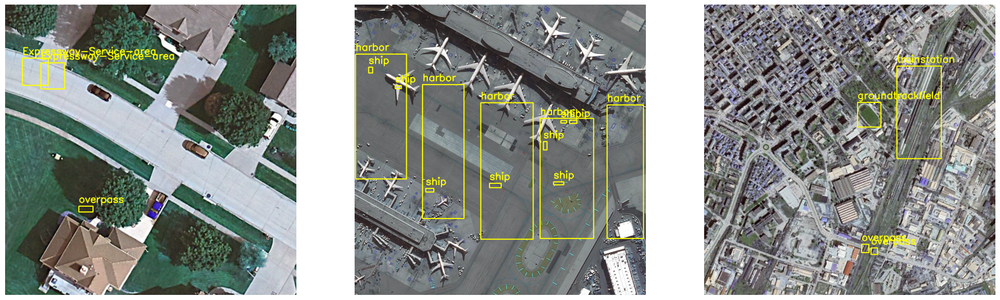

In [26]:
plt.figure(figsize=(25, 8))
rand_int = random.sample(range(len(yolo_annot_file_list)), 3)
for i in range(3):
    plt.subplot(1, 3, i+1)
    plot_bboxes(image_data_file_list[rand_int[i]], yolo_annot_file_list[rand_int[i]], class_dict_idx)

## Training the Yolo Model

Before training the model need to change directories as per the yolo

In [27]:
# Creating images and labels directory into the data directory
root_dir = '../data/DIOR/'

img_train_dir = os.path.join(root_dir, 'train/images')
img_val_dir = os.path.join(root_dir, 'val/images')
label_train_dir = os.path.join(root_dir, 'train/labels')
label_val_dir = os.path.join(root_dir, 'val/labels')

# Using 20% of the test dataset for validation
total_val_size = int(len(test_file_list) * 0.2)
total_val_size

2347

In [28]:
# # Moving the Train images
# if not os.path.exists(img_train_dir):
#     os.makedirs(img_train_dir)
#     print('[INFO] Train image directory is created.')
# else:
#     print('[INFO] Train image directory exists.')

# for img in tqdm(trainval_file_list):
#     if os.path.isfile(img):
#         shutil.copy(img, img_train_dir)

In [29]:
# # Moving the Validation images[20% of test dataset]
# if not os.path.exists(img_val_dir):
#     os.makedirs(img_val_dir)

# for filepath in tqdm(test_file_list[:total_val_size]):
#     if os.path.isfile(filepath):
#         shutil.copy(filepath, img_val_dir)

In [30]:
# # Moving the training labels
# if not os.path.exists(label_train_dir):
#     os.makedirs(label_train_dir)

# for filepath in tqdm(trainval_file_list):
#     file_path = filepath.replace('JPEGImages-trainval', 'yolo_annotations').replace('.jpg', '.txt')
#     if os.path.isfile(file_path):
#         shutil.copy(file_path, label_train_dir)

In [31]:
# # Moving the validation labels[20% of test dataset]
# if not os.path.exists(label_val_dir):
#     os.makedirs(label_val_dir)

# for filepath in tqdm(test_file_list[:total_val_size]):
#     file_path = filepath.replace('JPEGImages-test', 'yolo_annotations').replace('.jpg', '.txt')
#     if os.path.isfile(file_path):
#         shutil.move(file_path, label_val_dir)

In [32]:
# Loading the model
model = YOLO('yolov8n.yaml') # Builds the model from scratch

# Loading a pretrained model (Not using this for my dataset)
# model = YOLO('yolov8n.pt') 

Creating a config.yaml file for feeding the details to yolo model

In [33]:
%%writefile config.yaml
# Path to my dataset
path: '../data/DIOR/'
train: 'train/images'
val: 'val/images'

# Classes as per mentioned in the annotation
names:
  0: Expressway-Service-area
  1: Expressway-toll-station
  2: airplane
  3: airport
  4: baseballfield
  5: basketballcourt
  6: bridge
  7: chimney
  8: dam
  9: golffield
  10: groundtrackfield
  11: harbor
  12: overpass
  13: ship
  14: stadium
  15: storagetank
  16: tenniscourt
  17: trainstation
  18: vehicle
  19: windmill 

Overwriting config.yaml


In [ ]:
# Training the model for 1 epoch
results = model.train(data='config.yaml', imgsz=800, epochs=1, batch=8, name='yolov8n_epochs1_batch16')

Ultralytics 8.3.57  Python-3.8.20 torch-1.9.1+cu111 CUDA:0 (NVIDIA GeForce RTX 3080, 10240MiB)
WARNING  Upgrade to torch>=2.0.0 for deterministic training.
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=config.yaml, epochs=1, time=None, patience=100, batch=8, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_epochs1_batch163, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, 

train: Scanning C:\Users\yangc\Developer\data\DIOR\train\labels... 11725 images, 0 backgrounds, 0 corrupt: 100%|██████████| 11725/11725 [00:06<00:00, 1828.71it/s]

train: WARNING  C:\Users\yangc\Developer\data\DIOR\train\images\00594.jpg: 1 duplicate labels removed


train: New cache created: C:\Users\yangc\Developer\data\DIOR\train\labels.cache


val: Scanning C:\Users\yangc\Developer\data\DIOR\val\labels... 2347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2347/2347 [00:01<00:00, 1444.92it/s]


val: New cache created: C:\Users\yangc\Developer\data\DIOR\val\labels.cache


## Testing the Yolo Model

In [ ]:
# Creating a test directory
img_test_dir = 'datasets/images/test'

# Moving the Testing images[80% of test dataset]
if not os.path.exists(img_test_dir):
    os.makedirs(img_test_dir)

test_list = os.listdir('dior_data/JPEGImages-test')
for filename in tqdm(test_list):
    filepath = os.path.join('dior_data/JPEGImages-test', filename)
    if os.path.isfile(filepath):
        shutil.move(filepath, img_test_dir)

: 

In [25]:
label_test_dir = 'datasets/labels/test'

# Moving the testing annotation [80% of testing dataset]
if not os.path.exists(label_test_dir):
    os.makedirs(label_test_dir)

for filename in tqdm(test_list):
    filepath = os.path.join('dior_data/yolo_annotations', filename).replace('jpg', 'txt')
    if os.path.isfile(filepath):
        shutil.move(filepath, label_test_dir)

  0%|          | 0/9391 [00:00<?, ?it/s]

Creating a test config file for the model


In [32]:
%%writefile test_config.yaml
# Path to my dataset
path:
train:
val: 'images/test'

# Classes as per mentioned in the annotation
names:
  0: Expressway-Service-area
  1: Expressway-toll-station
  2: airplane
  3: airport
  4: baseballfield
  5: basketballcourt
  6: bridge
  7: chimney
  8: dam
  9: golffield
  10: groundtrackfield
  11: harbor
  12: overpass
  13: ship
  14: stadium
  15: storagetank
  16: tenniscourt
  17: trainstation
  18: vehicle
  19: windmill 

Overwriting test_config.yaml


In [3]:
# Loading the best weights
model = YOLO('runs/detect/yolov8n_epochs50_batch16/weights/best.pt')

In [33]:
# Validating the 
test_results = model.val(data='test_config.yaml', imgsz=800, name='yolov8n_val_on_test')

Ultralytics YOLOv8.0.85 🚀 Python-3.9.16 torch-1.12.1+cu116 CUDA:0 (Quadro P5000, 16279MiB)


  0%|          | 0.00/755k [00:00<?, ?B/s]

val: Scanning /notebooks/datasets/labels/test... 9391 images, 0 backgrounds, 0 corrupt: 100%|██████████| 9391/9391 [00:19<00:00, 485.80it/s]
val: New cache created: /notebooks/datasets/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 587/587 [02:15<00:00,  4.32it/s]
                   all       9391      98630      0.817      0.632       0.71      0.485
Expressway-Service-area       9391        860      0.802      0.708      0.778       0.51
Expressway-toll-station       9391        561      0.875      0.522      0.629      0.477
              airplane       9391       6423       0.93      0.663      0.792      0.535
               airport       9391        538      0.753      0.692      0.761      0.468
         baseballfield       9391       2699      0.943       0.69       0.82      0.674
       basketballcourt       9391       1677      0.899      0.821      0.867      0.724
                bridge       939

## Best YoloV8n Model Testing Results

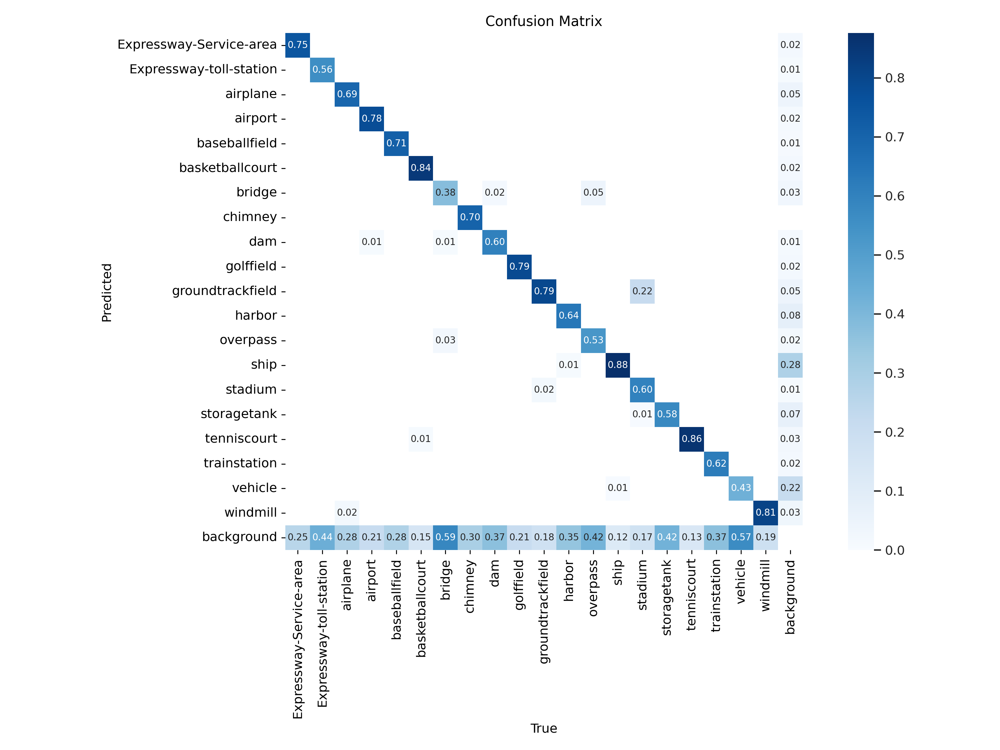

In [36]:
# Confusion Matrix
Image('runs/detect/yolov8n_val_on_test3/confusion_matrix.png')

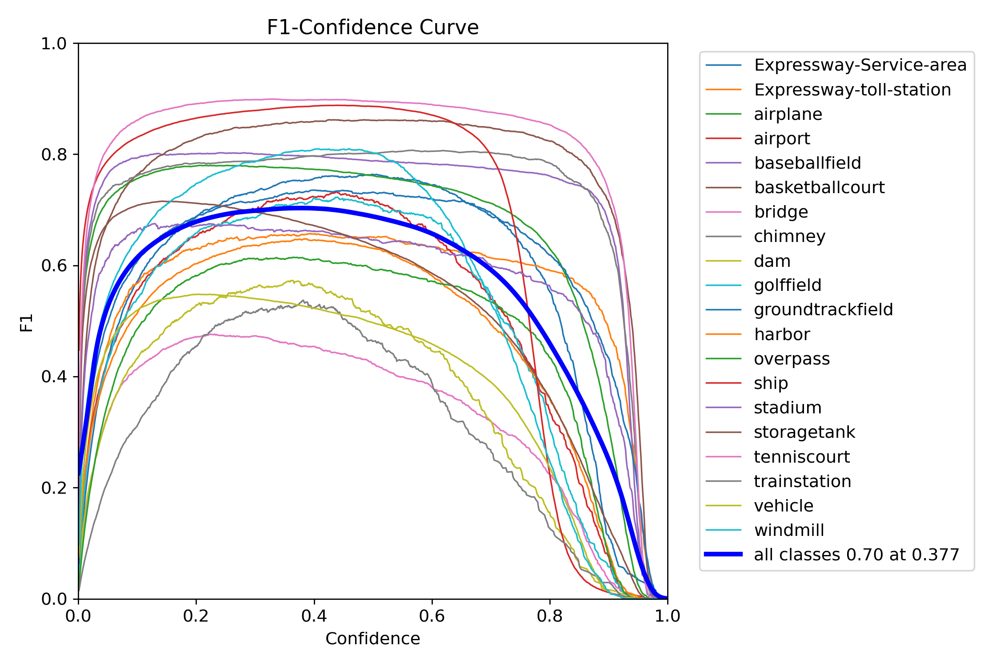

In [35]:
# F1 Curve
Image('runs/detect/yolov8n_val_on_test3/F1_curve.png')

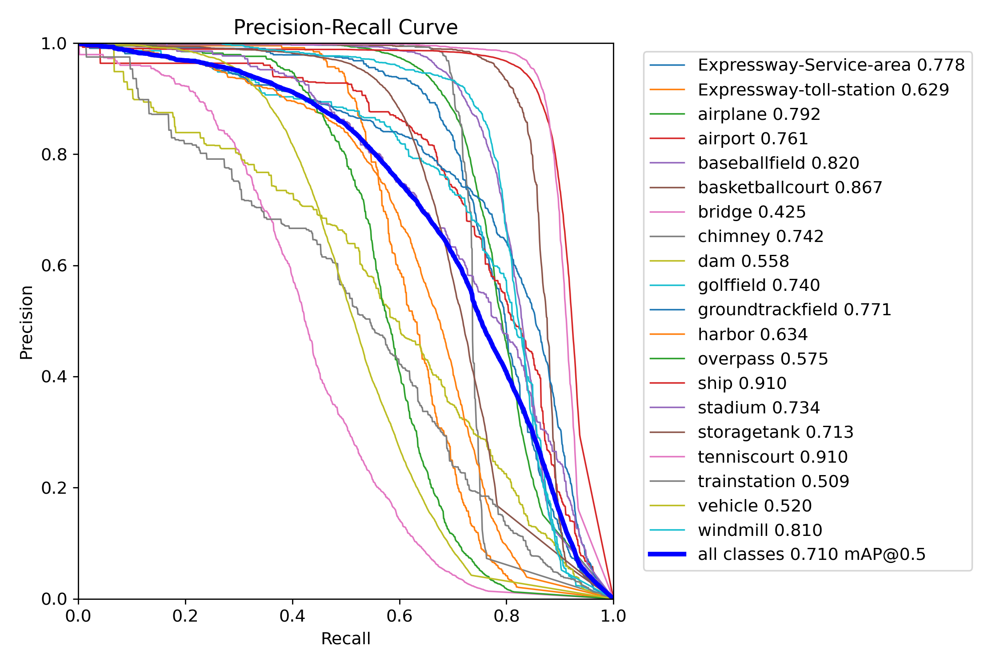

In [37]:
# PR Curve
Image('runs/detect/yolov8n_val_on_test3/PR_curve.png')

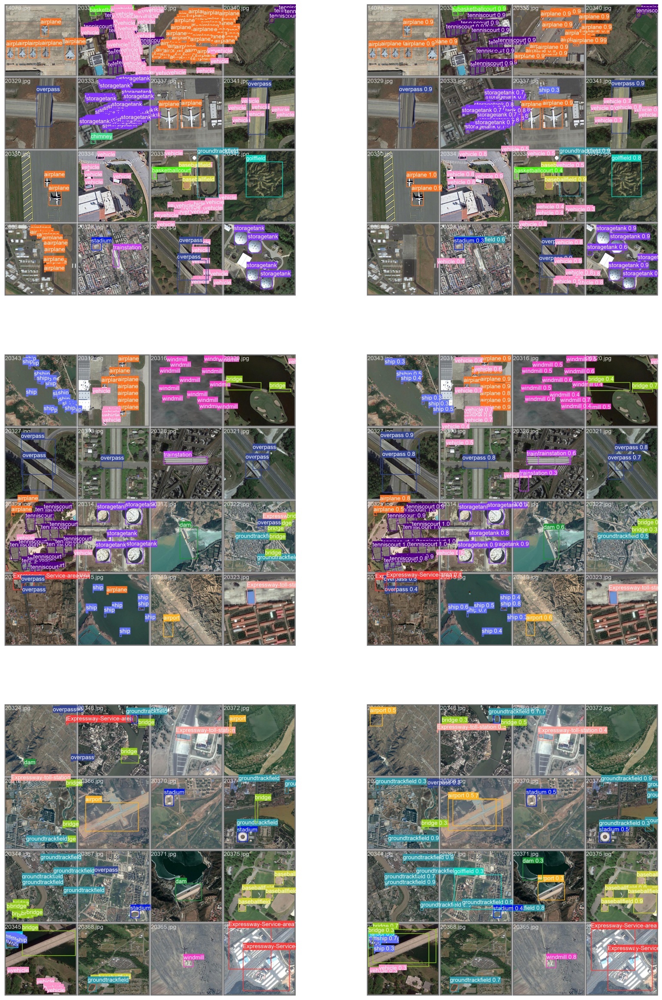

In [38]:
# Testing result[left images are True and Right images are predicted]
val_result_image = ['runs/detect/yolov8n_val_on_test3/val_batch0_labels.jpg', 'runs/detect/yolov8n_val_on_test3/val_batch0_pred.jpg', 'runs/detect/yolov8n_val_on_test3/val_batch1_labels.jpg', 'runs/detect/yolov8n_val_on_test3/val_batch1_pred.jpg', 'runs/detect/yolov8n_val_on_test3/val_batch2_labels.jpg', 'runs/detect/yolov8n_val_on_test3/val_batch2_pred.jpg']
plt.figure(figsize=(20, 30))
for i in range(len(val_result_image)):
    plt.subplot(3, 2, i+1)
    plt.imshow(plt.imread(val_result_image[i]))
    plt.axis(False)

## Predicting using the Yolo Model

In [3]:
# Loading the best weights
model = YOLO('runs/detect/yolov8n_epochs50_batch16/weights/best.pt')


image 1/1 /notebooks/datasets/images/test/16377.jpg: 800x800 1 bridge, 13.8ms
Speed: 0.7ms preprocess, 13.8ms inference, 2.3ms postprocess per image at shape (1, 3, 800, 800)
Results saved to runs/detect/predict3


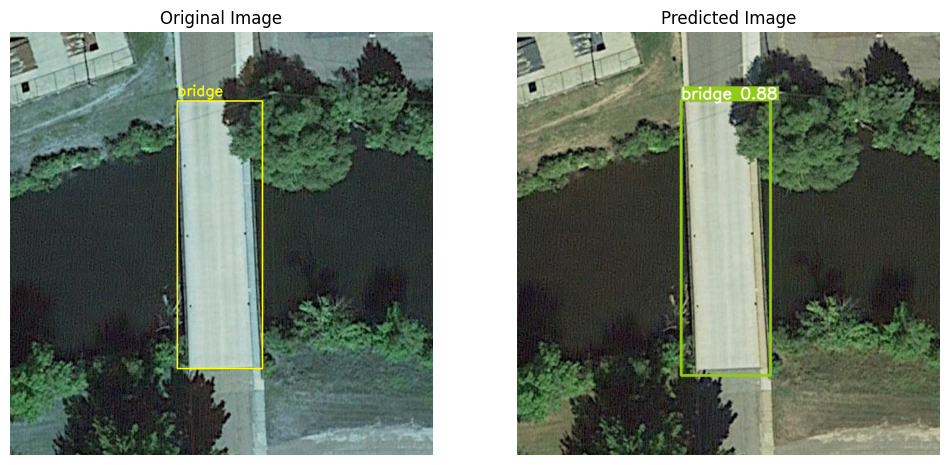

In [14]:
# Choosing a random images from the test dataset
img_test_dir = 'datasets/images/test'
label_test_dir = 'datasets/labels/test'
rand_img = random.sample(os.listdir(img_test_dir), 1)[0]
rand_img_path = os.path.join(img_test_dir, rand_img)
rand_label_path = os.path.join(label_test_dir, rand_img).replace('jpg', 'txt')

# Predicting the object using the yolo model
pred_list = model.predict(source=rand_img_path, imgsz=800, save=True, conf=0.5)
pred_img_path = os.path.join('runs/detect/predict3', rand_img) # Predict path can change

# Ploting a the true and predicted images with bounding boxes
plt.figure(figsize=(12, 7))
plt.subplot(1, 2, 1)
plot_bboxes(rand_img_path, rand_label_path, class_dict_idx)
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(plt.imread(pred_img_path))
plt.title('Predicted Image')
plt.axis(False);

In [14]:
# Predicting on video files that the model has not seen.
video_list = ['test_data/ships_test.mp4', 'test_data/airplane_test.mp4']
for file in video_list:
    pred_list = model.predict(source=file, imgsz=800, save=True, conf=0.5)



    WARNING ⚠️ stream/video/webcam/dir predict source will accumulate results in RAM unless `stream=True` is passed,
    causing potential out-of-memory errors for large sources or long-running streams/videos.

    Usage:
        results = model(source=..., stream=True)  # generator of Results objects
        for r in results:
            boxes = r.boxes  # Boxes object for bbox outputs
            masks = r.masks  # Masks object for segment masks outputs
            probs = r.probs  # Class probabilities for classification outputs

video 1/1 (1/449) /notebooks/test_data/ships_test.mp4: 480x800 7 ships, 2 vehicles, 16.1ms
video 1/1 (2/449) /notebooks/test_data/ships_test.mp4: 480x800 7 ships, 2 vehicles, 19.8ms
video 1/1 (3/449) /notebooks/test_data/ships_test.mp4: 480x800 6 ships, 3 vehicles, 12.4ms
video 1/1 (4/449) /notebooks/test_data/ships_test.mp4: 480x800 3 ships, 2 vehicles, 10.7ms
video 1/1 (5/449) /notebooks/test_data/ships_test.mp4: 480x800 2 ships, 3 vehicles, 14.3ms
vide

In [ ]:
Video('runs/detect/predict2/ships_test.mp4', width=500, embed=True)

In [ ]:
Video('runs/detect/predict2/airplane_test.mp4', width=500, embed=True)